In [1]:
import pandas as pd
import numpy as np

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
x_train = np.load('/content/drive/MyDrive/x_train.npy')
y_train = np.load('/content/drive/MyDrive/y_train.npy')
x_val = np.load('/content/drive/MyDrive/x_val.npy')
y_val = np.load('/content/drive/MyDrive/y_val.npy')

print(x_train.shape, y_train.shape)
print(x_val.shape, y_val.shape)

(2586, 26, 34, 1) (2586, 1)
(288, 26, 34, 1) (288, 1)


In [3]:
x_train = x_train.astype(np.float32)
y_train = y_train.astype(np.float32)
x_val = x_val.astype(np.float32)
y_val = y_val.astype(np.float32)

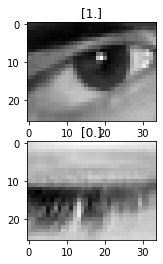

In [8]:
import matplotlib.pyplot as plt

plt.subplot(2, 1, 1)
plt.title(str(y_train[0]))
plt.imshow(x_train[0].reshape((26, 34)), cmap='gray')

plt.subplot(2, 1, 2)
plt.title(str(y_train[1]))
plt.imshow(x_train[1].reshape((26, 34)), cmap='gray')

In [6]:
from keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=10,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2
)

val_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow(
    x=x_train, y=y_train,
    batch_size=32,
    shuffle=True
)

val_generator = val_datagen.flow(
    x=x_val, y=y_val,
    batch_size=32,
    shuffle=False
)

In [9]:
from keras.layers import Input, Activation, Conv2D, Flatten, Dense, MaxPooling2D
from keras.models import Model, load_model

def cnn ():
    inputs = Input(shape=(26, 34, 1))
    cnn_model = Conv2D(32, kernel_size=3, strides=1, padding='same', activation='relu')(inputs)
    cnn_model = MaxPooling2D(pool_size=2)(cnn_model)
    cnn_model = Conv2D(64, kernel_size=3, strides=1, padding='same', activation='relu')(cnn_model)
    cnn_model = MaxPooling2D(pool_size=2)(cnn_model)
    cnn_model = Conv2D(128, kernel_size=3, strides=1, padding='same', activation='relu')(cnn_model)
    cnn_model = MaxPooling2D(pool_size=2)(cnn_model)
    cnn_model = Flatten()(cnn_model)
    cnn_model = Dense(512)(cnn_model)
    cnn_model = Activation('relu')(cnn_model)
    cnn_model = Dense(1)(cnn_model)
    outputs = Activation('sigmoid')(cnn_model)

    model = Model(inputs=inputs, outputs=outputs)

    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['acc'])
    return model

In [10]:
model = cnn()
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 26, 34, 1)]       0         
                                                                 
 conv2d (Conv2D)             (None, 26, 34, 32)        320       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 13, 17, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 13, 17, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 6, 8, 64)         0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 6, 8, 128)         73856 

In [23]:
import datetime
from keras.callbacks import EarlyStopping, ModelCheckpoint

models_time = datetime.datetime.now().strftime('%Y_%m_%d')
checkpoint_filepath = ('models_%s.h5' % (models_time))

early_stop = EarlyStopping(monitor='val_acc', min_delta=0, patience=10, verbose=1)

save_best = ModelCheckpoint(
    filepath=checkpoint_filepath, monitor='val_acc', verbose=1, save_best_only=False,
    save_weights_only=True, mode='auto', save_freq='epoch', options=None)

In [24]:
model.fit_generator(
    train_generator, epochs=50, validation_data=val_generator,
    callbacks=[early_stop, save_best])

Epoch 1/50
 1/81 [..............................] - ETA: 8s - loss: 0.0052 - acc: 1.0000

<ipython-input-24-b8a8a8f7c148>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  model.fit_generator(


81/81 [==============================] - ETA: 0s - loss: 0.0425 - acc: 0.9849
Epoch 1: saving model to models_2022_12_05.h5
81/81 [==============================] - 7s 85ms/step - loss: 0.0425 - acc: 0.9849 - val_loss: 0.0239 - val_acc: 0.9896
Epoch 2/50
81/81 [==============================] - ETA: 0s - loss: 0.0265 - acc: 0.9930
Epoch 2: saving model to models_2022_12_05.h5
81/81 [==============================] - 7s 84ms/step - loss: 0.0265 - acc: 0.9930 - val_loss: 0.0073 - val_acc: 0.9931
Epoch 3/50
81/81 [==============================] - ETA: 0s - loss: 0.0276 - acc: 0.9892
Epoch 3: saving model to models_2022_12_05.h5
81/81 [==============================] - 7s 87ms/step - loss: 0.0276 - acc: 0.9892 - val_loss: 0.0114 - val_acc: 0.9965
Epoch 4/50
81/81 [==============================] - ETA: 0s - loss: 0.0200 - acc: 0.9954
Epoch 4: saving model to models_2022_12_05.h5
81/81 [==============================] - 7s 83ms/step - loss: 0.0200 - acc: 0.9954 - val_loss: 0.0131 - val_acc

In [25]:
!ls

drive  models_2022_12_05.h5  sample_data


In [26]:
model.load_weights(checkpoint_filepath)

In [27]:
test_loss, test_acc = model.evaluate_generator(val_generator, verbose=1)

4/9 [============>.................] - ETA: 0s - loss: 0.0480 - acc: 0.9844

<ipython-input-27-bb47ca120e3d>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  test_loss, test_acc = model.evaluate_generator(val_generator, verbose=1)


9/9 [==============================] - 0s 21ms/step - loss: 0.0424 - acc: 0.9861


In [29]:
IMG_SIZE = (34, 26)

def crop_eye(img, eye_points):
  x1, y1 = np.amin(eye_points, axis=0)
  x2, y2 = np.amax(eye_points, axis=0)
  cx, cy = (x1 + x2) / 2, (y1 + y2) / 2

  w = (x2 - x1) * 1.2
  h = w * IMG_SIZE[1] / IMG_SIZE[0]

  margin_x, margin_y = w / 2, h / 2

  min_x, min_y = int(cx - margin_x), int(cy - margin_y)
  max_x, max_y = int(cx + margin_x), int(cy + margin_y)

  eye_rect = np.rint([min_x, min_y, max_x, max_y]).astype(np.int)

  eye_img = gray[eye_rect[1]:eye_rect[3], eye_rect[0]:eye_rect[2]]

  return eye_img, eye_rect

In [43]:
import cv2

cap = cv2.VideoCapture('/content/test_jk.mp4')

<ipython-input-29-89d17f5f1c33>:16: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  eye_rect = np.rint([min_x, min_y, max_x, max_y]).astype(np.int)


1/1 [==============================] - 0s 19ms/step


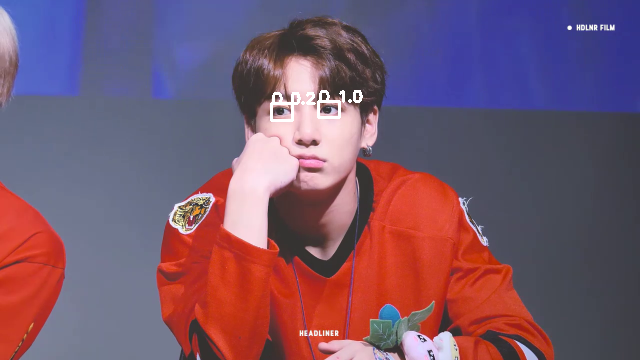

1/1 [==============================] - 0s 34ms/step


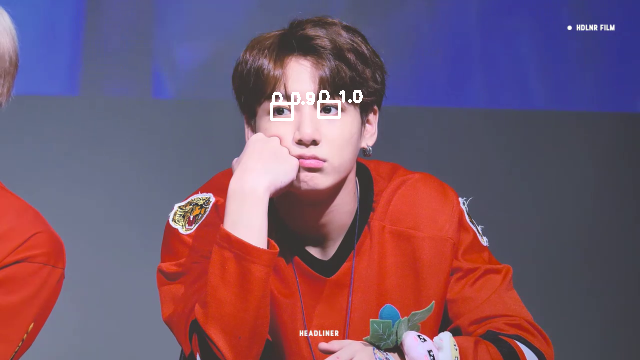

1/1 [==============================] - 0s 20ms/step


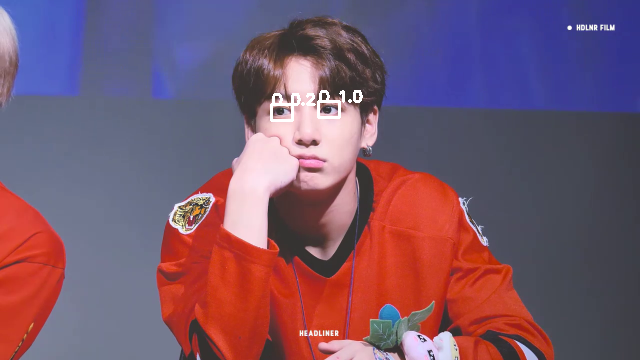

1/1 [==============================] - 0s 19ms/step


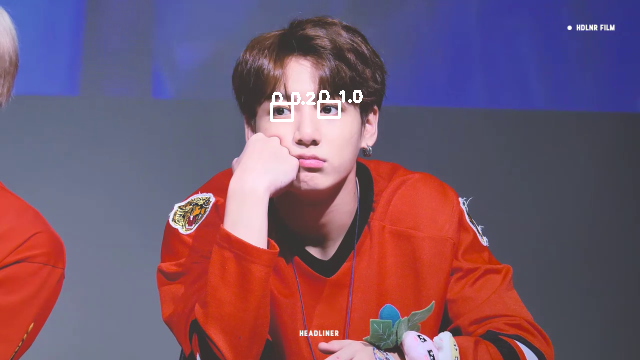

1/1 [==============================] - 0s 21ms/step


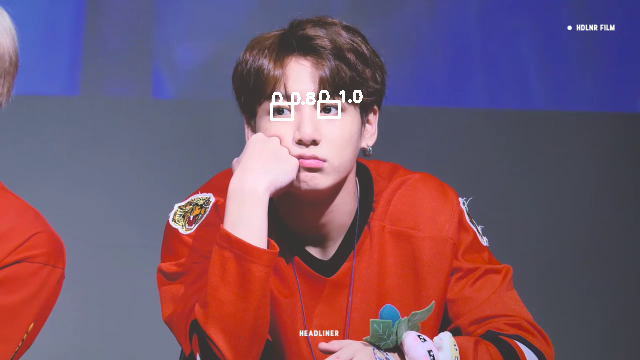

1/1 [==============================] - 0s 22ms/step


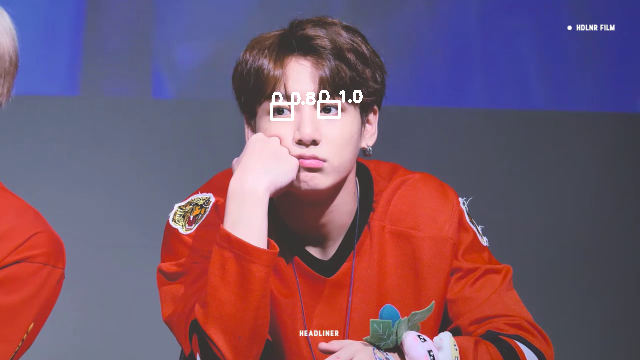

1/1 [==============================] - 0s 28ms/step


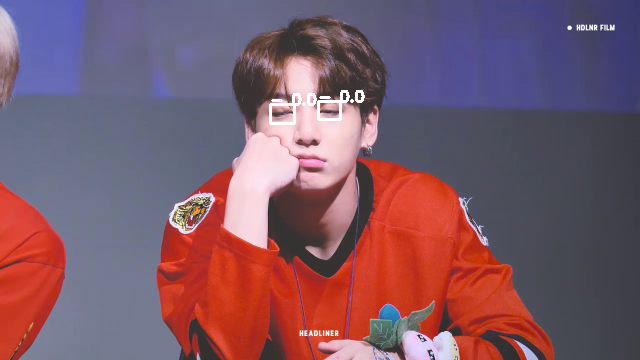

1/1 [==============================] - 0s 21ms/step


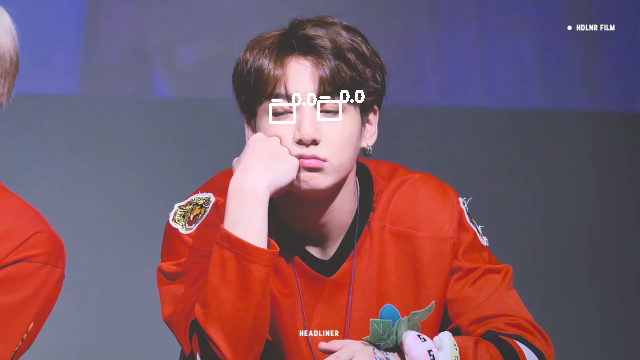

1/1 [==============================] - 0s 23ms/step


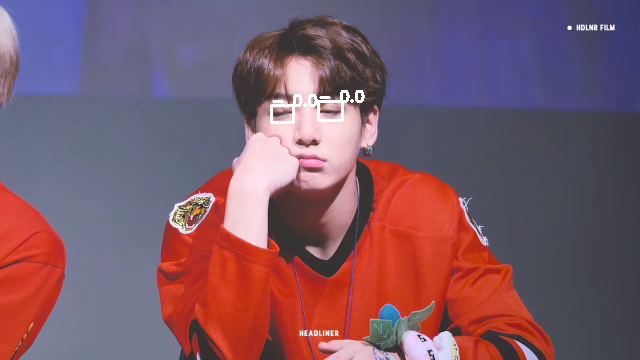

1/1 [==============================] - 0s 19ms/step


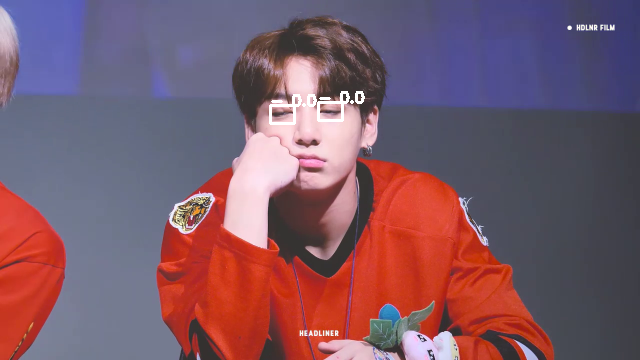

1/1 [==============================] - 0s 30ms/step


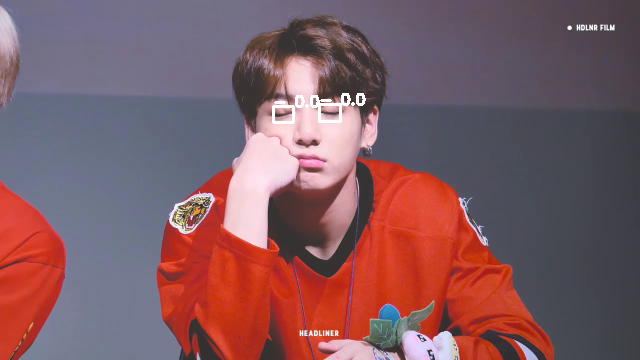

1/1 [==============================] - 0s 27ms/step


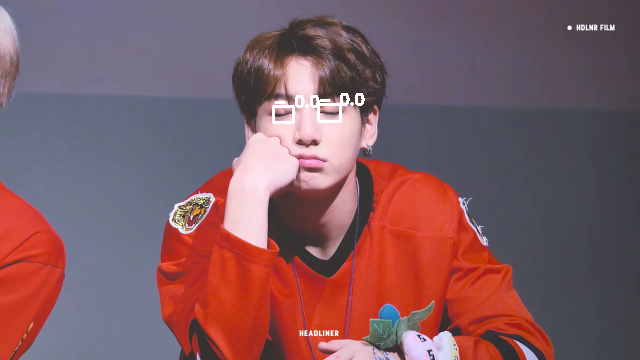

1/1 [==============================] - 0s 35ms/step


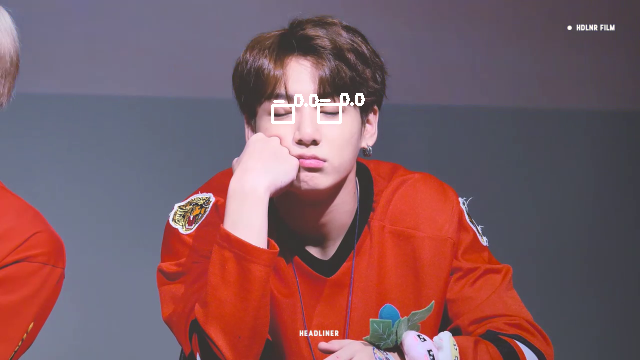

1/1 [==============================] - 0s 29ms/step


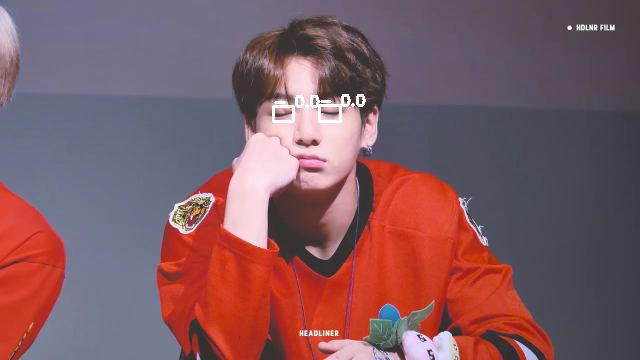

1/1 [==============================] - 0s 27ms/step


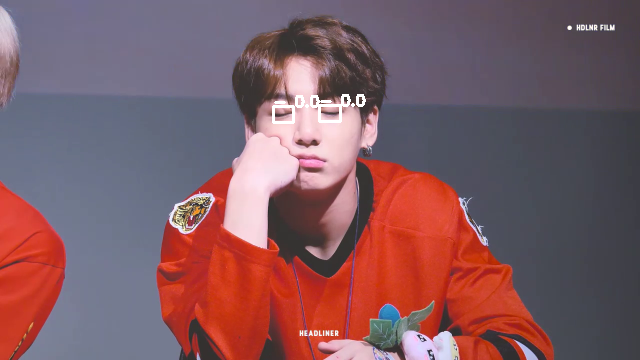

1/1 [==============================] - 0s 32ms/step


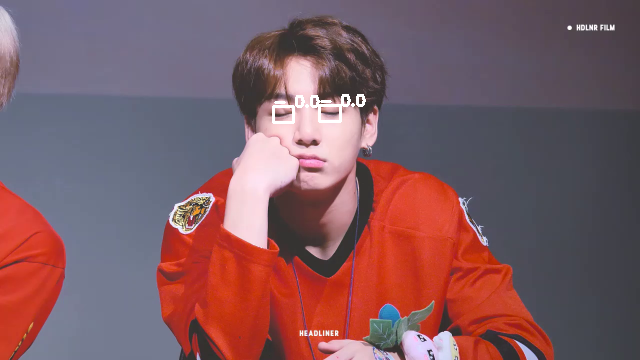

1/1 [==============================] - 0s 31ms/step


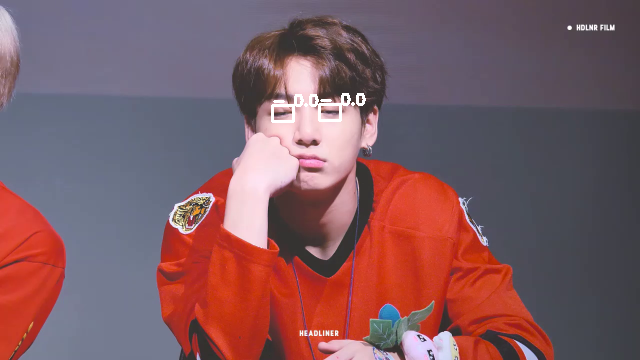

1/1 [==============================] - 0s 28ms/step


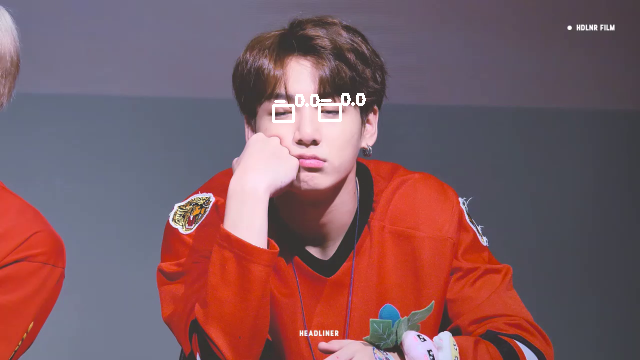

1/1 [==============================] - 0s 27ms/step


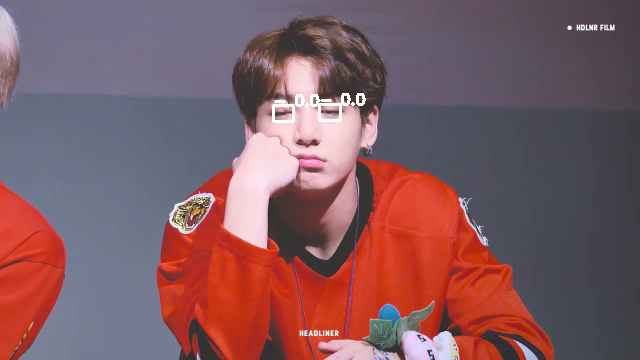

1/1 [==============================] - 0s 28ms/step


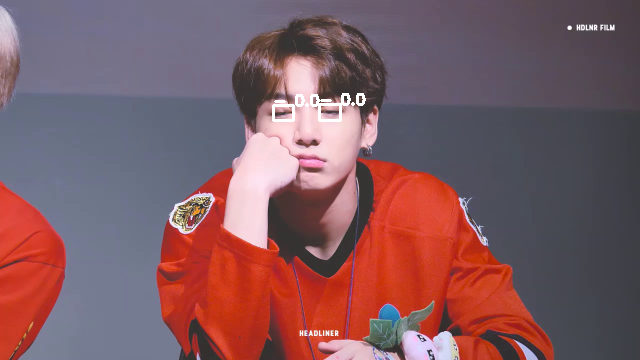

1/1 [==============================] - 0s 34ms/step


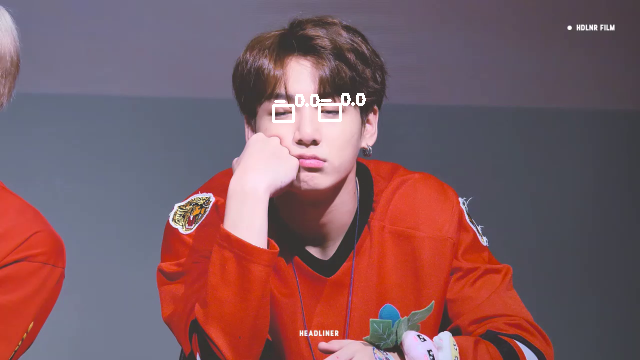

1/1 [==============================] - 0s 28ms/step


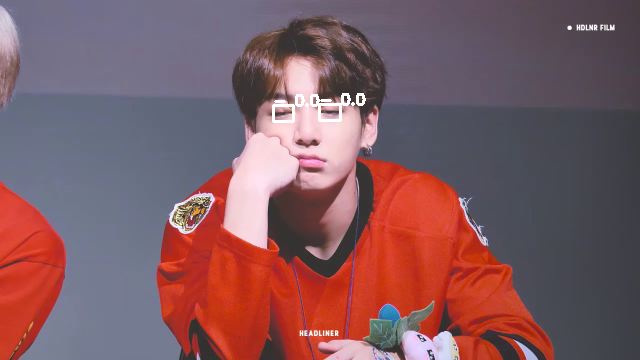

1/1 [==============================] - 0s 29ms/step


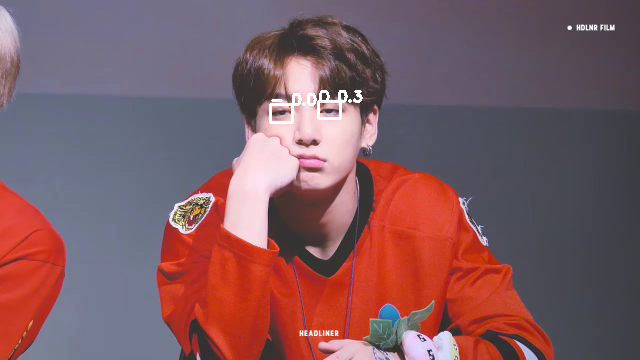

1/1 [==============================] - 0s 28ms/step


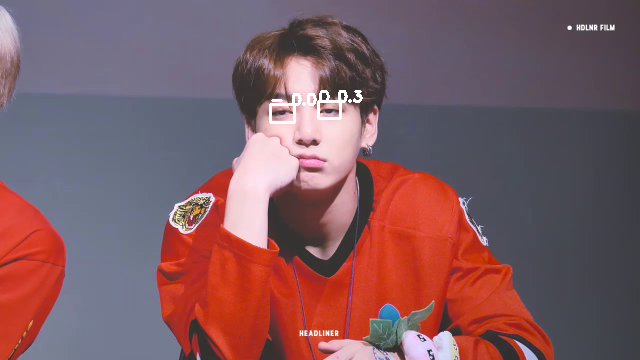

1/1 [==============================] - 0s 28ms/step


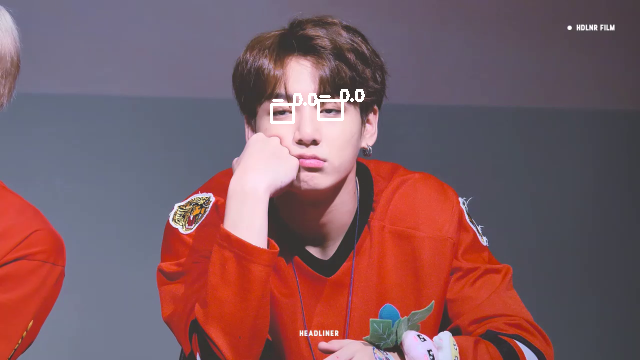

1/1 [==============================] - 0s 27ms/step


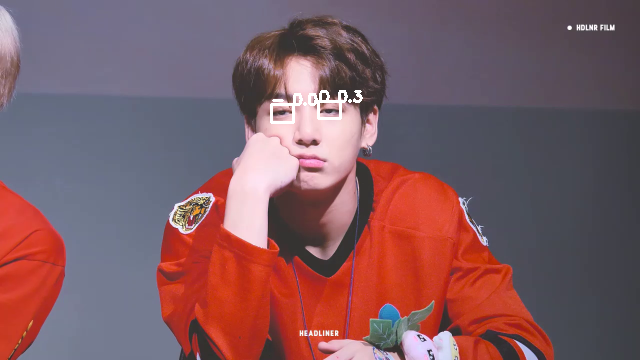

1/1 [==============================] - 0s 28ms/step


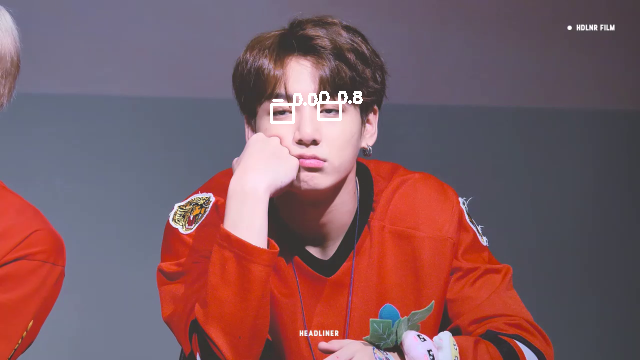

1/1 [==============================] - 0s 40ms/step


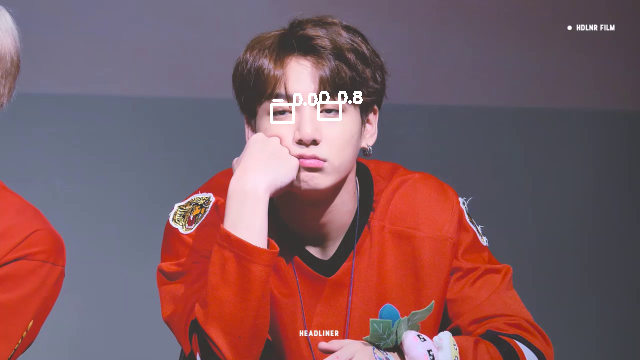

1/1 [==============================] - 0s 38ms/step


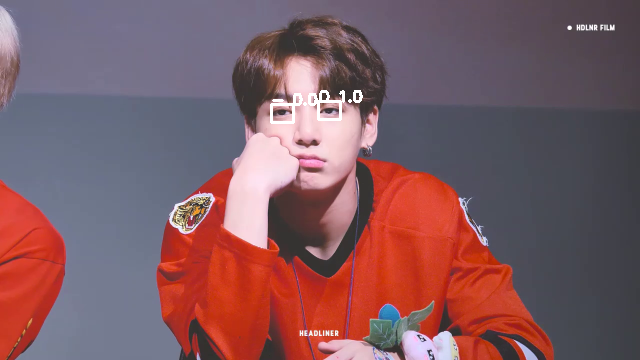

1/1 [==============================] - 0s 32ms/step


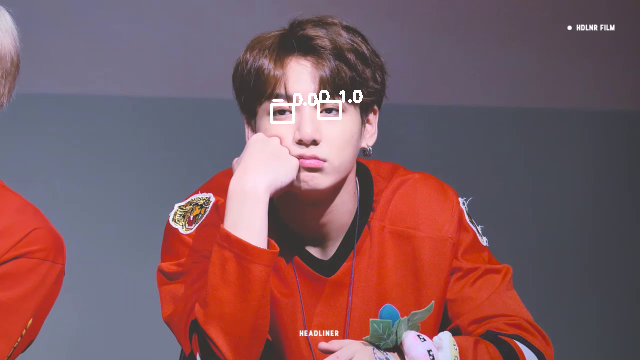

1/1 [==============================] - 0s 28ms/step


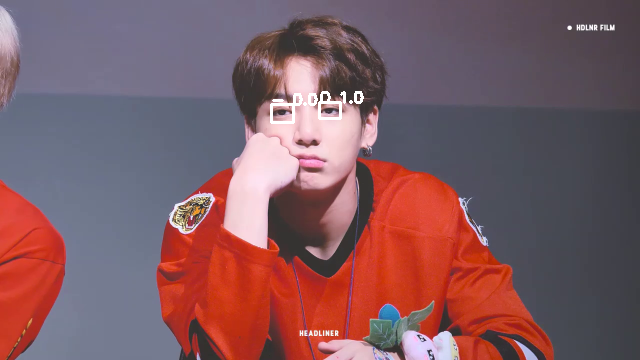

1/1 [==============================] - 0s 30ms/step


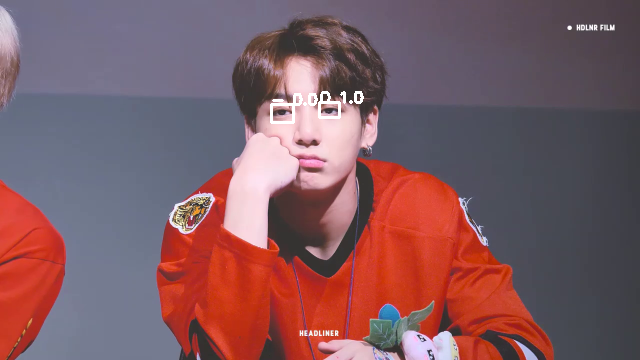

1/1 [==============================] - 0s 34ms/step


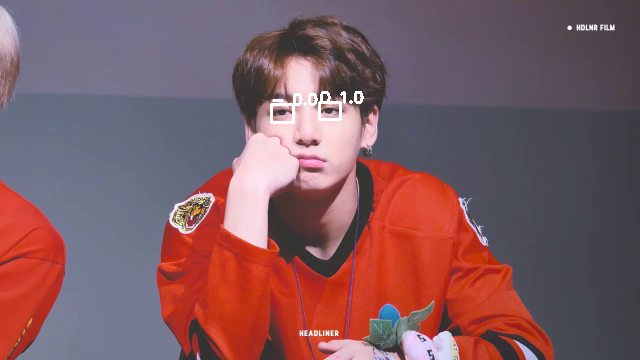

1/1 [==============================] - 0s 28ms/step


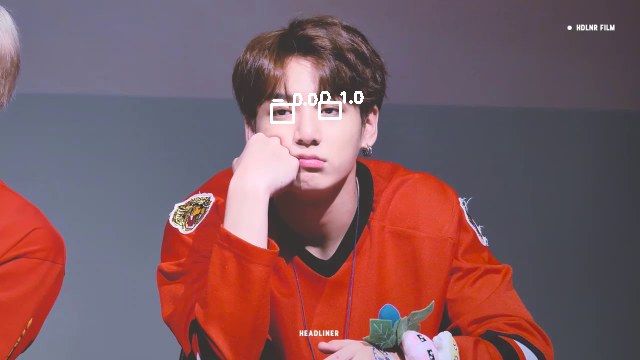

1/1 [==============================] - 0s 39ms/step


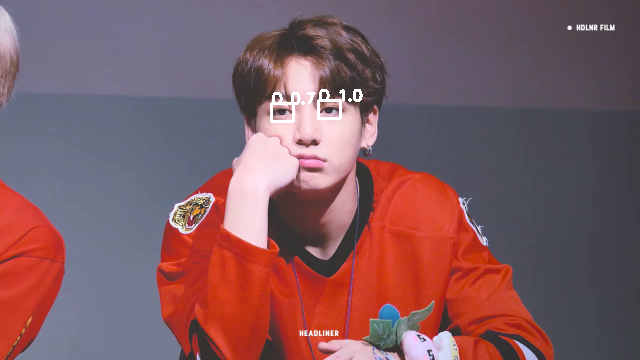

1/1 [==============================] - 0s 27ms/step


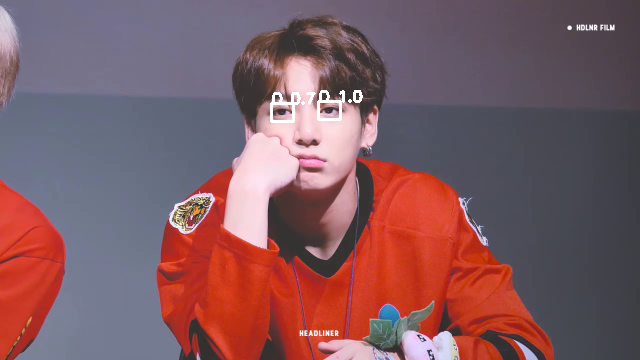

1/1 [==============================] - 0s 33ms/step


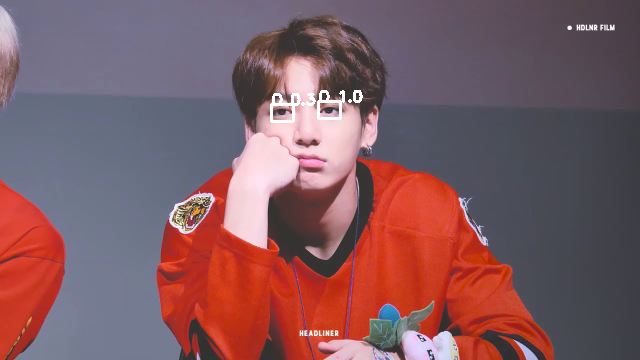

1/1 [==============================] - 0s 29ms/step


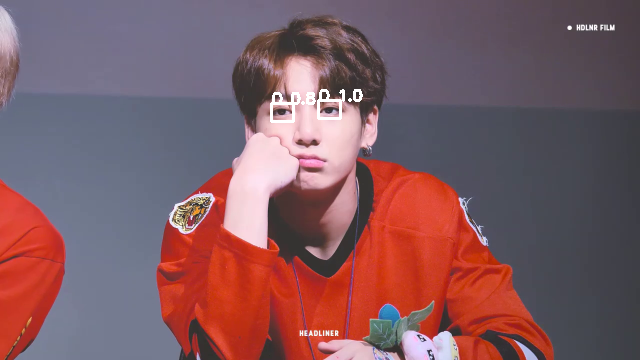

1/1 [==============================] - 0s 37ms/step


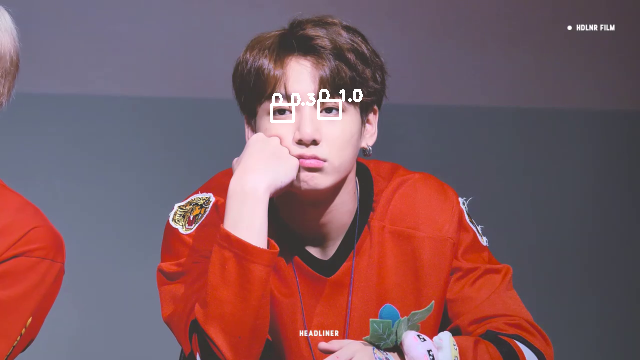

1/1 [==============================] - 0s 28ms/step


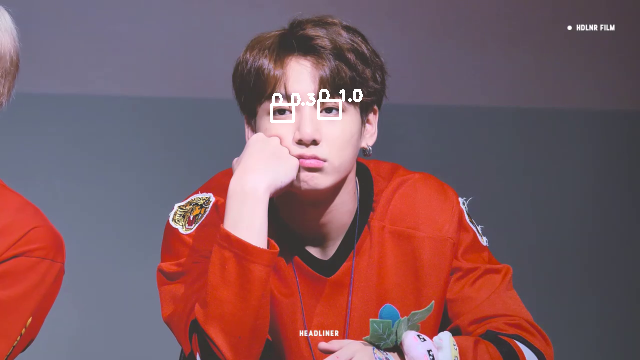

1/1 [==============================] - 0s 28ms/step


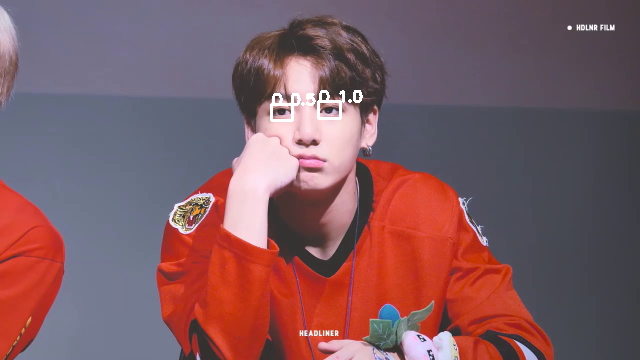

1/1 [==============================] - 0s 30ms/step


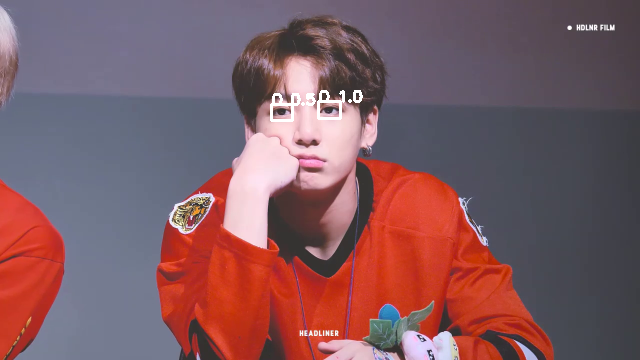

1/1 [==============================] - 0s 30ms/step


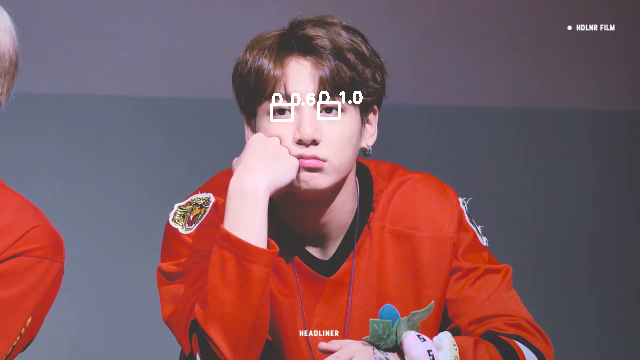

1/1 [==============================] - 0s 27ms/step


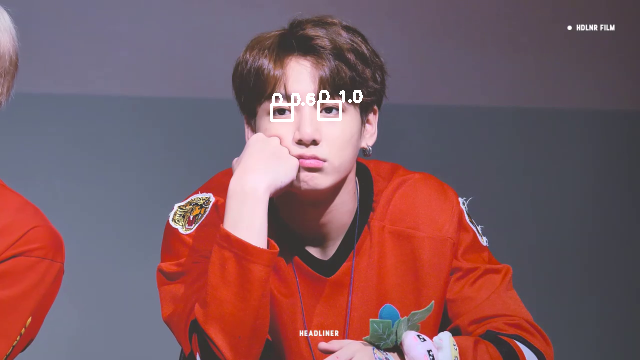

1/1 [==============================] - 0s 32ms/step


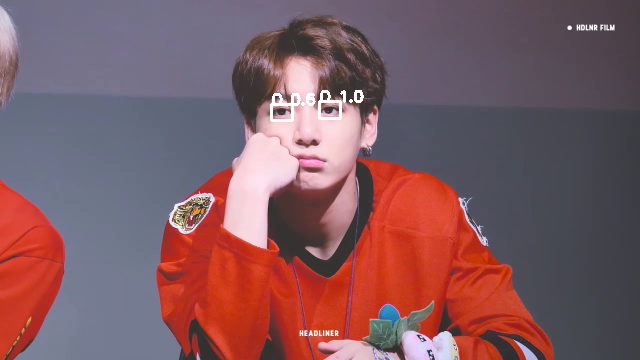

1/1 [==============================] - 0s 30ms/step


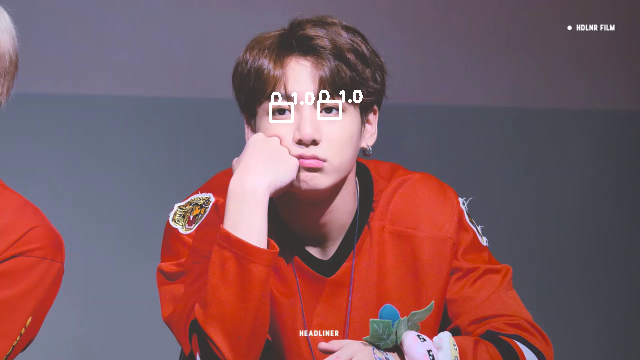

1/1 [==============================] - 0s 29ms/step


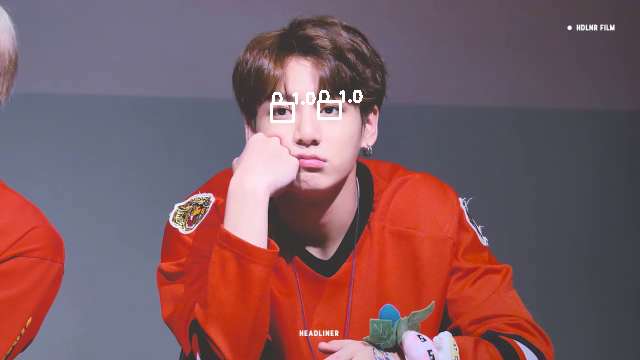

1/1 [==============================] - 0s 46ms/step


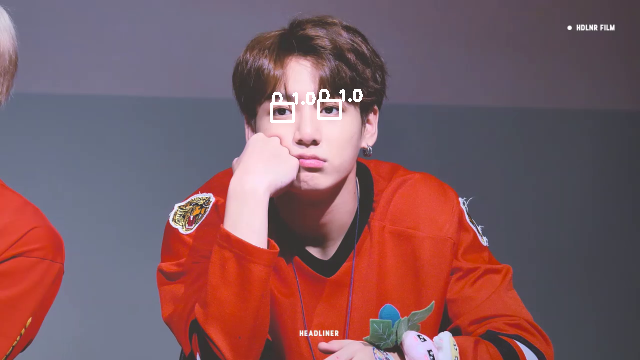

1/1 [==============================] - 0s 29ms/step


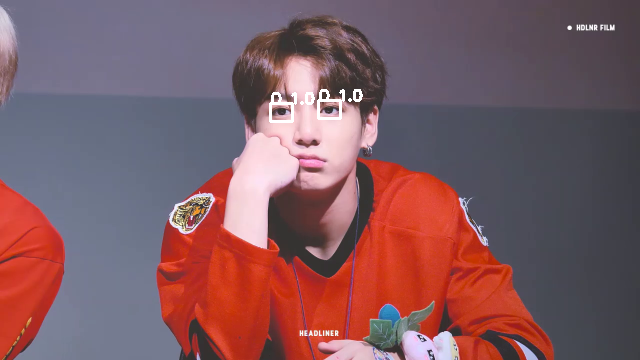

1/1 [==============================] - 0s 27ms/step


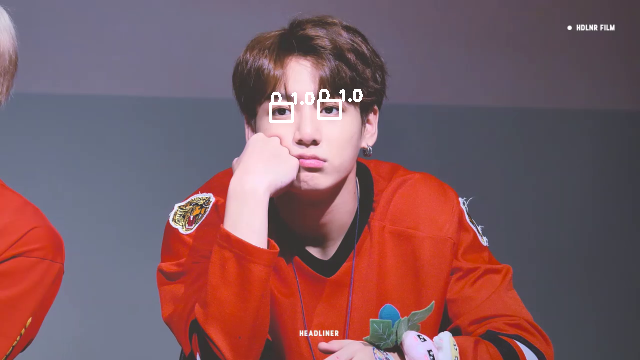

1/1 [==============================] - 0s 31ms/step


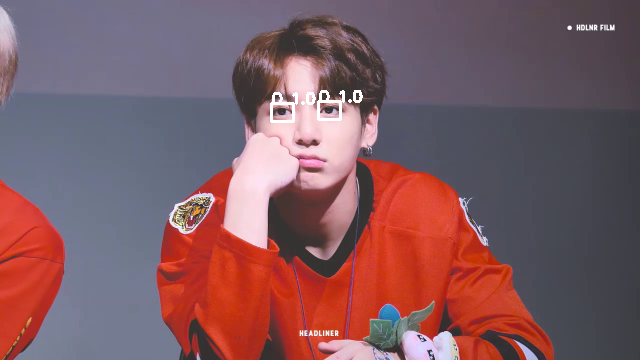

1/1 [==============================] - 0s 28ms/step


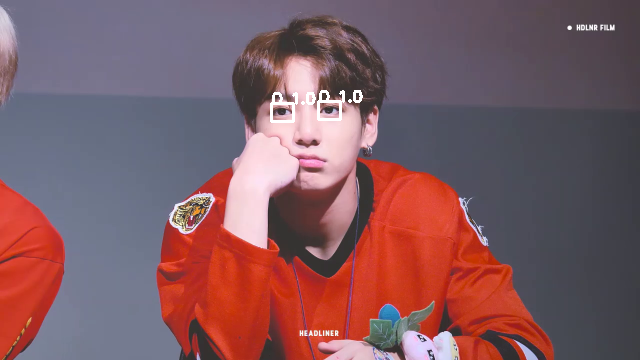

1/1 [==============================] - 0s 28ms/step


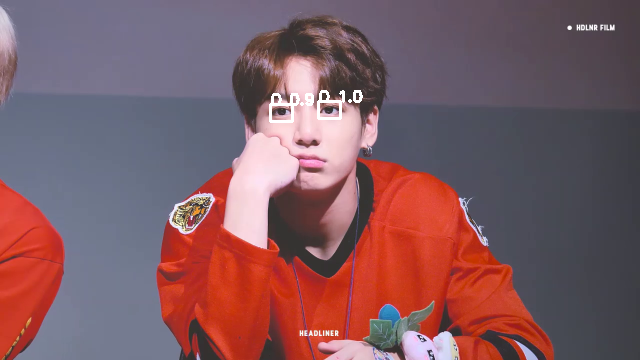

1/1 [==============================] - 0s 29ms/step


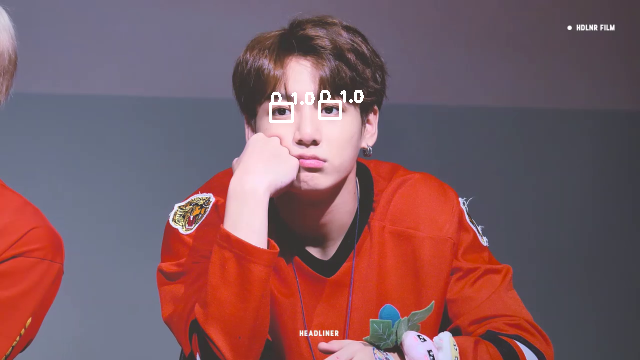

1/1 [==============================] - 0s 36ms/step


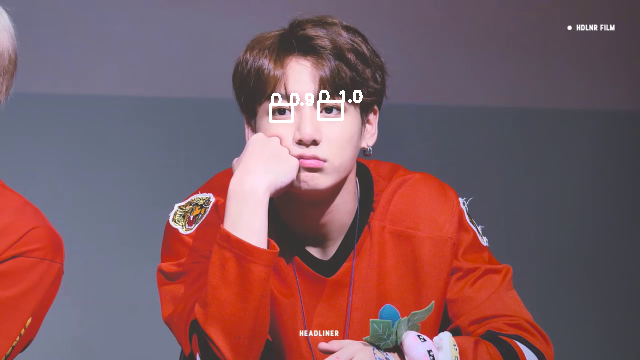

1/1 [==============================] - 0s 31ms/step


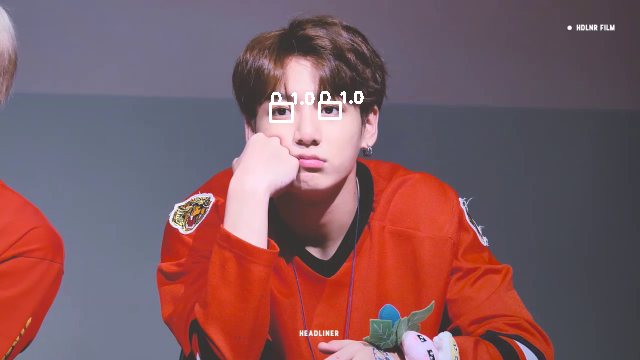

1/1 [==============================] - 0s 28ms/step


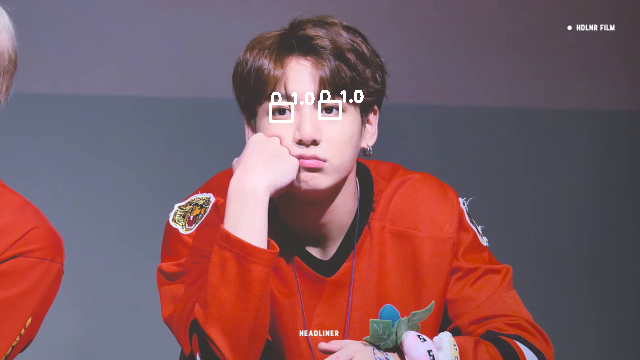

1/1 [==============================] - 0s 28ms/step


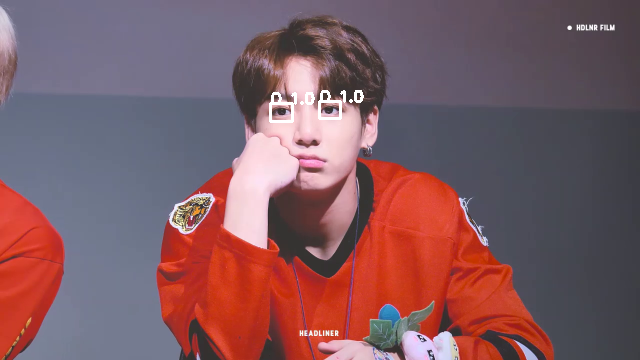

1/1 [==============================] - 0s 27ms/step


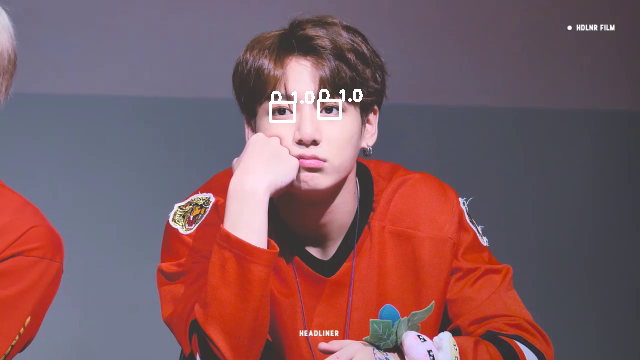

1/1 [==============================] - 0s 26ms/step


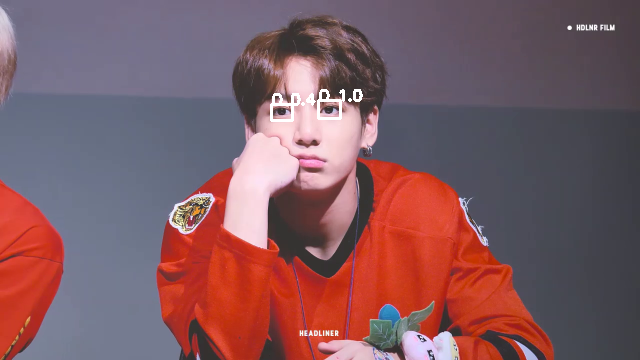

1/1 [==============================] - 0s 27ms/step


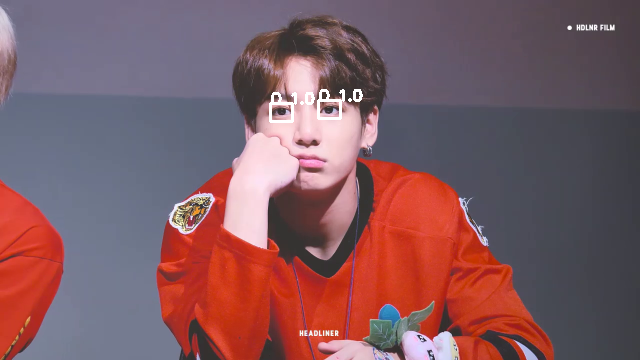

1/1 [==============================] - 0s 28ms/step


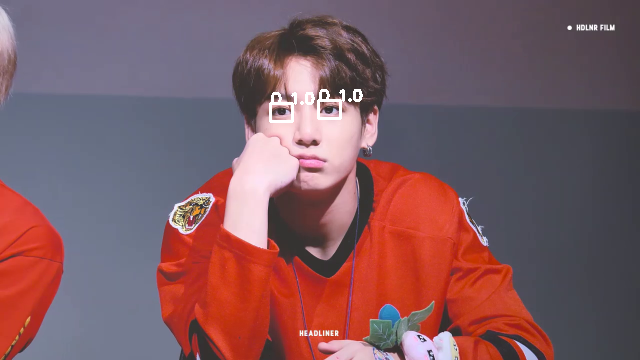

1/1 [==============================] - 0s 28ms/step


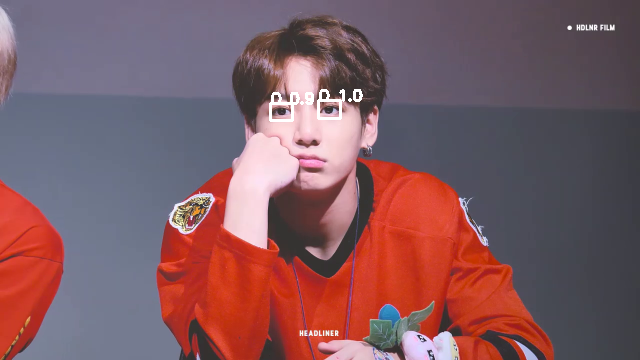

1/1 [==============================] - 0s 33ms/step


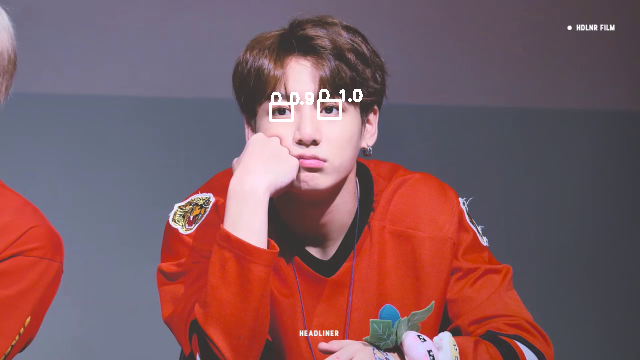

1/1 [==============================] - 0s 27ms/step


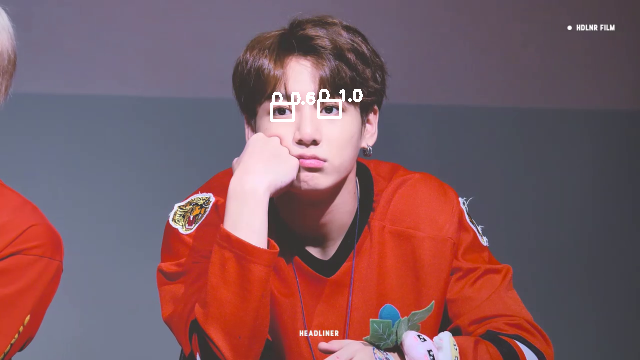

1/1 [==============================] - 0s 41ms/step


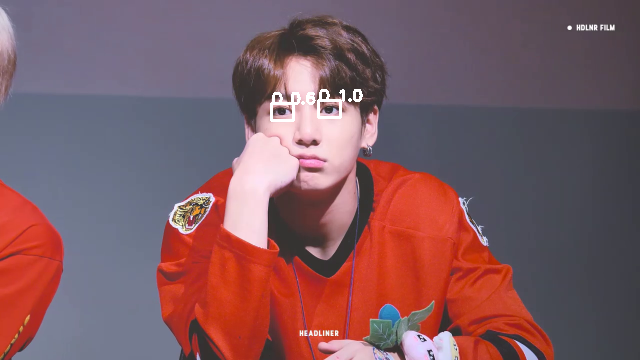

1/1 [==============================] - 0s 39ms/step


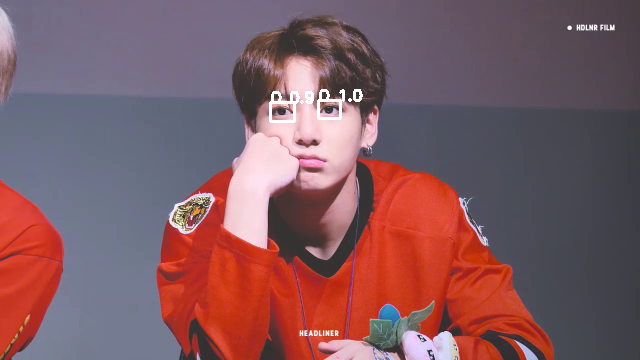

1/1 [==============================] - 0s 29ms/step


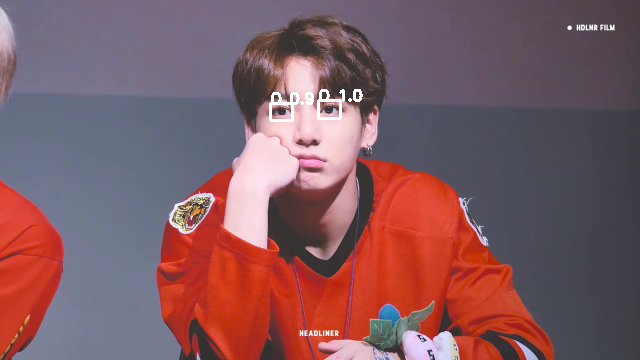

1/1 [==============================] - 0s 34ms/step


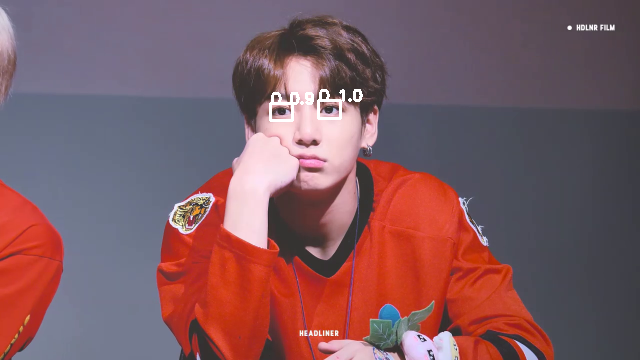

1/1 [==============================] - 0s 27ms/step


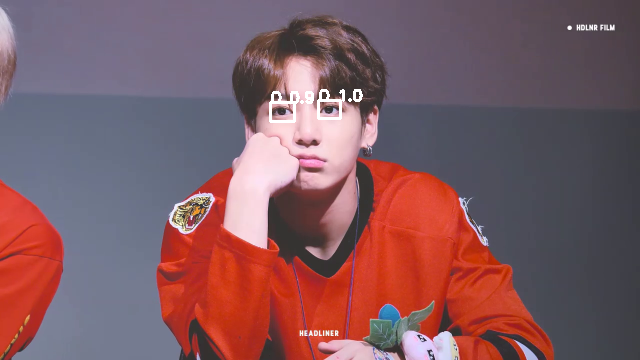

1/1 [==============================] - 0s 27ms/step


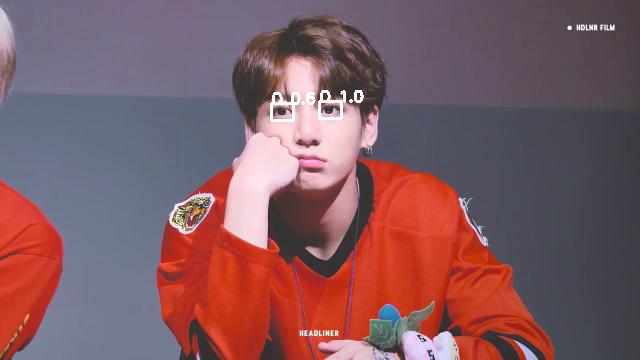

1/1 [==============================] - 0s 27ms/step


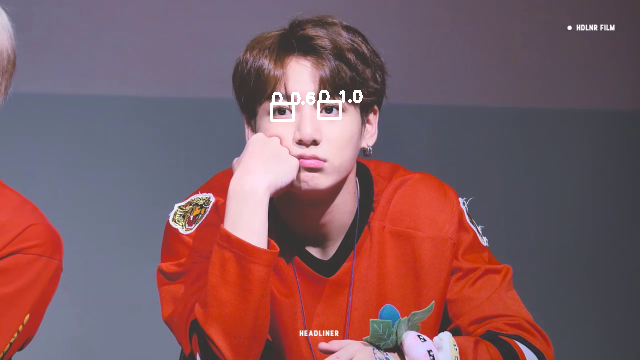

1/1 [==============================] - 0s 29ms/step


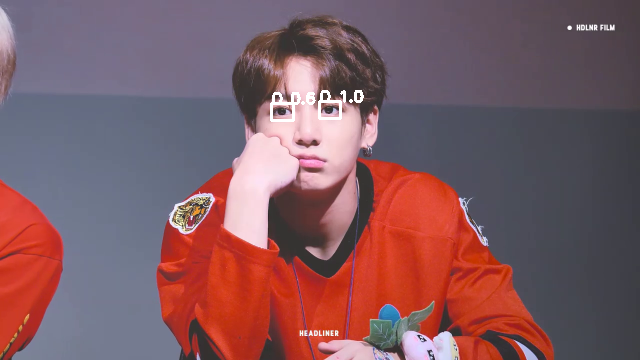

1/1 [==============================] - 0s 31ms/step


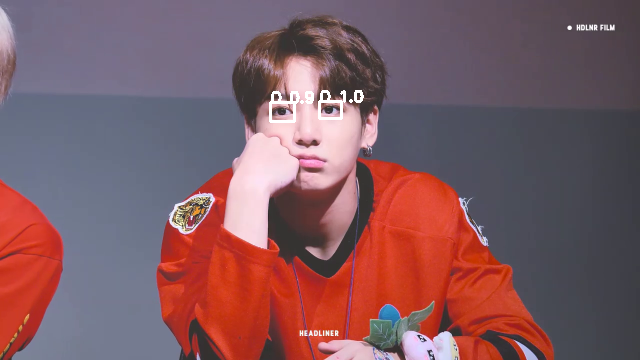

1/1 [==============================] - 0s 29ms/step


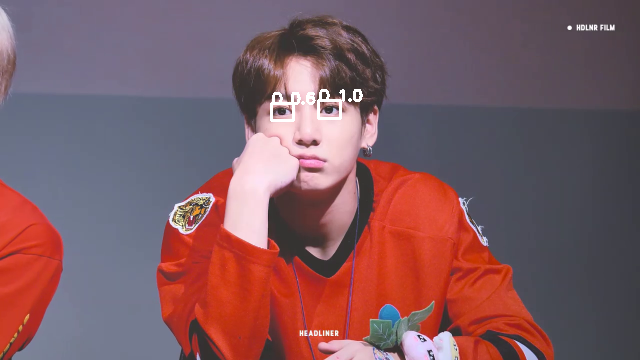

1/1 [==============================] - 0s 32ms/step


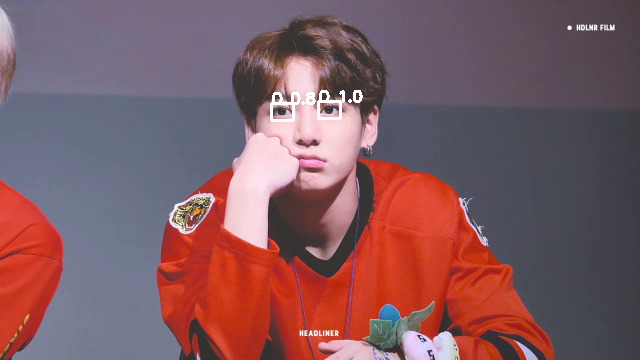

1/1 [==============================] - 0s 28ms/step


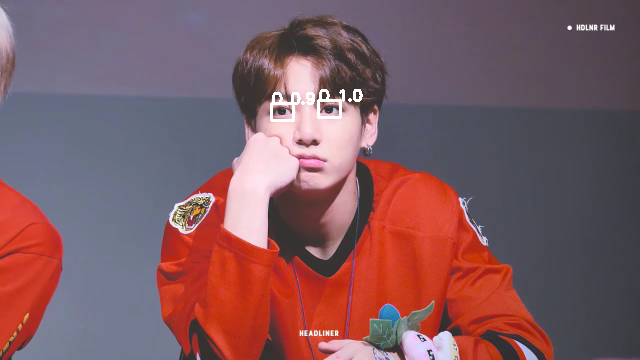

1/1 [==============================] - 0s 30ms/step


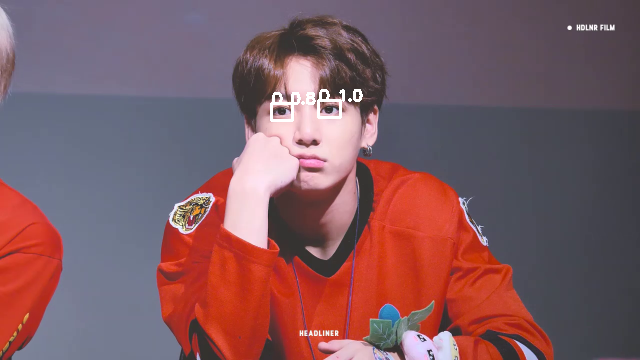

1/1 [==============================] - 0s 27ms/step


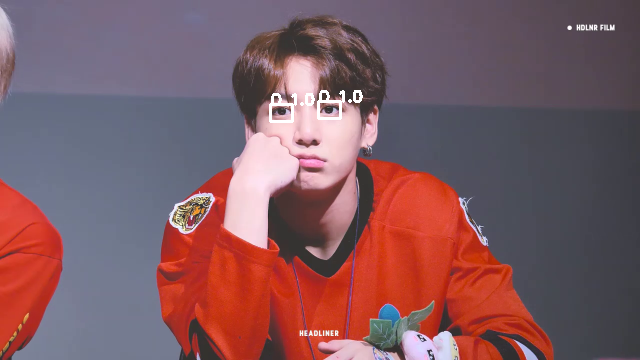

1/1 [==============================] - 0s 31ms/step


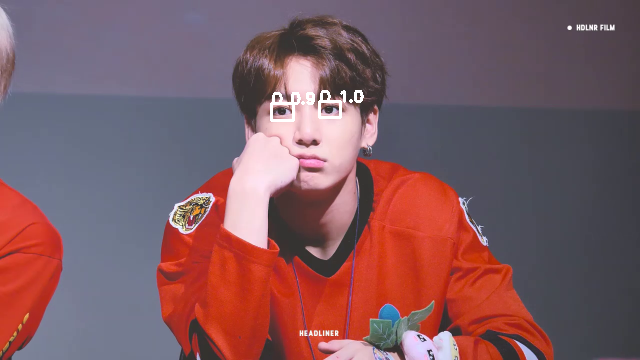

1/1 [==============================] - 0s 29ms/step


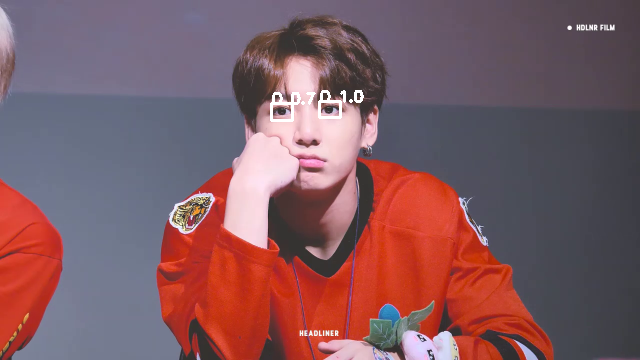

In [45]:
from google.colab.patches import cv2_imshow
import dlib
from imutils import face_utils

detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor('/content/shape_predictor_68_face_landmarks.dat')

while cap.isOpened():
  ret, img_ori = cap.read()

  if not ret:
    break

  img_ori = cv2.resize(img_ori, dsize=(0, 0), fx=0.5, fy=0.5)

  img = img_ori.copy()
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

  faces = detector(gray)

  for face in faces:
    shapes = predictor(gray, face)
    shapes = face_utils.shape_to_np(shapes)

    eye_img_l, eye_rect_l = crop_eye(gray, eye_points=shapes[36:42])
    eye_img_r, eye_rect_r = crop_eye(gray, eye_points=shapes[42:48])

    eye_img_l = cv2.resize(eye_img_l, dsize=IMG_SIZE)
    eye_img_r = cv2.resize(eye_img_r, dsize=IMG_SIZE)
    eye_img_r = cv2.flip(eye_img_r, flipCode=1)

    cv2_imshow(eye_img_l)
    cv2_imshow(eye_img_r)

    eye_input_l = eye_img_l.copy().reshape((1, IMG_SIZE[1], IMG_SIZE[0], 1)).astype(np.float32) / 255.
    eye_input_r = eye_img_r.copy().reshape((1, IMG_SIZE[1], IMG_SIZE[0], 1)).astype(np.float32) / 255.

    pred_l = model.predict(eye_input_l)
    pred_r = model.predict(eye_input_r)

    # visualize
    state_l = 'O %.1f' if pred_l > 0.1 else '- %.1f'
    state_r = 'O %.1f' if pred_r > 0.1 else '- %.1f'

    state_l = state_l % pred_l
    state_r = state_r % pred_r

    cv2.rectangle(img, pt1=tuple(eye_rect_l[0:2]), pt2=tuple(eye_rect_l[2:4]), color=(255,255,255), thickness=2)
    cv2.rectangle(img, pt1=tuple(eye_rect_r[0:2]), pt2=tuple(eye_rect_r[2:4]), color=(255,255,255), thickness=2)

    cv2.putText(img, state_l, tuple(eye_rect_l[0:2]), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,255), 2)
    cv2.putText(img, state_r, tuple(eye_rect_r[0:2]), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,255), 2)

  cv2_imshow(img)